In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"
from IPython.display import display
import matplotlib.pyplot as plt
import plotly.offline as py
plt.style.use('default')
py.init_notebook_mode(connected=True)

In [2]:
import numpy as np
import pandas as pd
from BITS.utils import load_pickle, save_pickle
from BITS.plot import plot_scatter
from logzero import logger

In [3]:
import src.dalayout.graph as graph

In [4]:
overlaps = load_pickle("develop/dmel_middle/overlaps.pkl")

In [7]:
overlaps.head(10)

,read_i,read_j,strand,i_start_unit,i_end_unit,i_n_unit,j_start_unit,j_end_unit,j_n_unit,i_start_bp,...,i_len_bp,j_start_bp,j_end_bp,j_len_bp,overlap_len,overlap_type,mean_score,path,mean_score_second,overlap_len_second
0,152,191213,1,4,17,25,0,13,14,1549,...,9485,8,5119,5119,5351,contains,0.043908,"[[4, 0], [5, 1], [6, 2], [7, 3], [8, 4], [9, 5...",0.023529,2292
1,152,206828,1,0,12,25,0,12,52,12,...,9485,87,4886,19102,4947,prefix-prefix,0.046154,"[[0, 39], [1, 40], [2, 41], [3, 42], [4, 43], ...",0.047059,762
2,152,239469,0,0,23,25,24,47,48,12,...,9485,9109,18085,18164,9201,contained,0.057721,"[[0, 24], [1, 25], [2, 26], [3, 27], [4, 28], ...",0.036000,9582
3,152,354579,0,0,18,25,3,21,22,12,...,9485,1061,8173,8173,7314,prefix-suffix,0.057895,"[[0, 3], [1, 4], [2, 5], [3, 6], [4, 7], [5, 8...",0.014338,6160
4,152,355191,0,0,14,25,10,24,25,12,...,9485,3858,9377,9377,5743,prefix-suffix,0.051176,"[[0, 10], [1, 11], [2, 12], [3, 13], [4, 14], ...",0.018542,8863
5,152,437699,1,0,24,25,32,56,75,12,...,9485,11900,21213,27818,9553,contained,0.047176,"[[0, 18], [1, 19], [2, 20], [3, 21], [4, 22], ...",0.013647,9567
6,219,2625,0,0,8,27,3,11,12,176,...,10673,1033,4315,4372,3427,prefix-suffix,0.065079,"[[0, 3], [1, 4], [2, 5], [3, 6], [4, 7], [5, 8...",0.028571,4606
7,219,213918,0,7,26,27,0,19,26,2836,...,10673,119,7439,9692,7620,suffix-prefix,0.042671,"[[7, 0], [8, 1], [9, 2], [10, 3], [11, 4], [12...",0.021053,7249
8,219,237083,0,0,9,27,2,11,12,176,...,10673,779,4357,4357,3807,contains,0.078571,"[[0, 2], [1, 3], [2, 4], [3, 5], [4, 6], [5, 7...",0.060714,4579
9,219,254536,0,11,26,27,0,15,54,4353,...,10673,58,5942,19881,6125,suffix-prefix,0.048020,"[[11, 0], [12, 1], [13, 2], [14, 3], [15, 4], ...",0.022222,10286


In [8]:
overlaps.shape[0]

24258

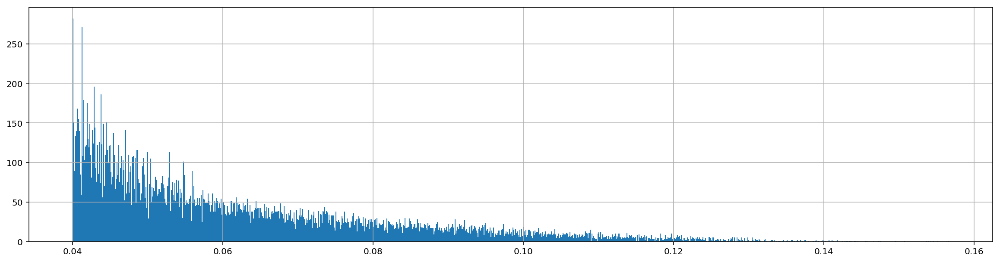

In [9]:
overlaps["mean_score"].hist(bins=1000, figsize=(20, 5))

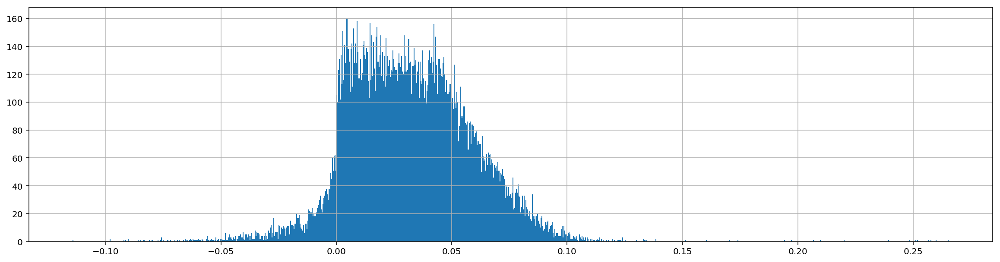

In [10]:
(overlaps["mean_score"] - overlaps["mean_score_second"]).hist(bins=1000, figsize=(20, 5))

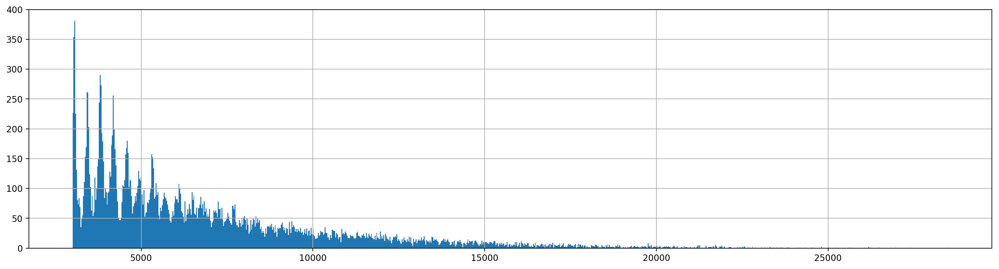

In [16]:
overlaps["overlap_len"].hist(bins=1000, figsize=(20, 5))

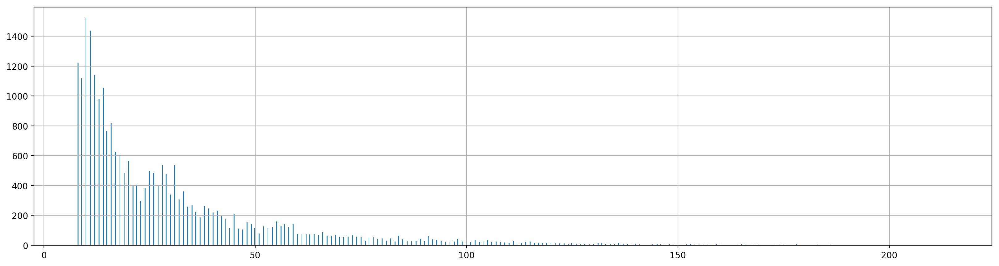

In [17]:
overlaps.apply(lambda df: len(df["path"]), axis=1).hist(bins=1000, figsize=(20, 5))

In [5]:
def make_sg(overlaps, min_score=0.04, diff_score=0.03, min_overlap_len=3000, plot=False):
    overlaps_filtered = overlaps[overlaps.apply(lambda df: df["mean_score"]  >= min_score
                                                and df["overlap_len"] >= min_overlap_len
                                                and df["mean_score"] - df["mean_score_second"] >= diff_score, axis=1)]
    logger.info(f"{overlaps_filtered.shape[0]} out of {overlaps.shape[0]} overlaps remained")
    sg = graph.construct_string_graph(overlaps_filtered)
    logger.info(f"{len(sg.vs)} nodes and {len(sg.es)} edges in the string graph")
    if plot:
        graph.draw_graph(sg)
    return sg

In [6]:
sg = make_sg(overlaps, 0.04, 0.03, 5000)

[I 190225 16:50:08 <ipython-input-5-6621d159bae0>:5] 8847 out of 24258 overlaps remained
[I 190225 16:50:09 <ipython-input-5-6621d159bae0>:7] 3688 nodes and 9092 edges in the string graph


In [7]:
sg_tr = graph.transitive_reduction(sg)

In [14]:
len(sg_tr.es)

6066

In [12]:
pos_tr = graph.draw_graph(sg_tr)

In [13]:
sg2 = make_sg(overlaps, 0.06, 0.05, 5000)

[I 190225 17:05:46 <ipython-input-5-6621d159bae0>:5] 4027 out of 24258 overlaps remained
[I 190225 17:05:47 <ipython-input-5-6621d159bae0>:7] 1934 nodes and 4288 edges in the string graph


In [16]:
sg2_tr = graph.transitive_reduction(sg2)

In [17]:
len(sg2_tr.es)

3064

In [18]:
pos2_tr = graph.draw_graph(sg2_tr)

In [6]:
cover_rate = pd.read_csv("develop/dmel_middle/cover_rate", sep='\t', index_col=0)

In [7]:
sg = make_sg(overlaps, 0.08, 0.05, 10000)

[I 190225 18:06:24 <ipython-input-5-6621d159bae0>:5] 864 out of 24258 overlaps remained
[I 190225 18:06:24 <ipython-input-5-6621d159bae0>:7] 558 nodes and 916 edges in the string graph


In [8]:
sg_tr = graph.transitive_reduction(sg)
len(sg_tr.es)

694

In [9]:
pos_tr = graph.draw_graph(sg_tr, cover_rate)

In [1]:
# Show coordinates of a vertex from its name
pos_tr[sg_tr.vs.find("44942:B").index]

NameError: name 'pos_tr' is not defined